In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import netwulf as nw
import pydot
import graphviz
import os
import cv2
import pickle
from tqdm import tqdm

# Data

In [2]:
df_post_balanced = pd.read_csv('/home/pelle/Master_Thesis/data/raw/wallstreetbets/balanced_data_chunked10.csv')
df_post_balanced['date'] = pd.to_datetime(df_post_balanced['date'])

In [3]:
sample = pd.read_csv('/home/pelle/Master_Thesis/data/raw/wallstreetbets/comments_pmaw_2016-2021_wsb.csv',nrows=10)
dtypes = sample.dtypes # Get the dtypes
cols = sample.columns # Get the columns
dtype_dictionary = {} 
for c in cols:
    if str(dtypes[c]) == 'int64':
        dtype_dictionary[c] = 'float32' # Handle NANs in int columns
    else:
        dtype_dictionary[c] = str(dtypes[c])
dtype_dictionary['author'] = 'str'
dtype_dictionary['body'] = 'str'
dtype_dictionary['parent_id'] = 'str'
dtype_dictionary['link_id'] = 'str'
dtype_dictionary['id'] = 'str'

df_comments_chunked = pd.read_csv('/home/pelle/Master_Thesis/data/raw/wallstreetbets/comments_pmaw_2016-2021_wsb.csv', dtype=dtype_dictionary, 
    on_bad_lines='skip',
    chunksize=1000000,
    low_memory=False,
    usecols=['author','parent_author','created_utc']
    )

df_comments = pd.concat(df_comments_chunked, ignore_index=True)
df_comments['created_utc'] = pd.to_datetime(df_comments['created_utc'], unit='s')

df_comments = df_comments[df_comments['author'] != '[deleted]']
df_comments = df_comments[df_comments['parent_author'] != '[deleted]']
df_comments = df_comments[df_comments['author'] != 'AutoModerator']
df_comments = df_comments[df_comments['parent_author'] != 'AutoModerator']
df_comments = df_comments.dropna()

print('Done reading!'+'\n')

Done reading!



# First 10 Weeks

In [277]:
min=df_comments['created_utc'].min()+pd.Timedelta(weeks=20)
min_stop = min + pd.Timedelta(weeks=10)

df_post_balanced_sub = df_post_balanced[(df_post_balanced['date'] > min) & (df_post_balanced['date'] < min_stop)]
df_post_balanced_sub=df_post_balanced_sub[['author','n_awards']]
df_comments_sub = df_comments[(df_comments['created_utc'] > min) & (df_comments['created_utc'] < min_stop)]
print('Done subsetting!'+'\n')


count_dict = df_comments_sub.groupby(['parent_author', 'author']).size().to_dict()

df_comments_sub['N_reciprocal'] = [count_dict.get((x['author'], x['parent_author']), 0) for _, x in df_comments_sub.iterrows()]
print('Done calculating reciprocity!'+'\n')

rec_max = df_comments_sub['N_reciprocal'].max()
rec_min = df_comments_sub['N_reciprocal'].min()
df_comments_sub['N_reciprocal'] = df_comments_sub['N_reciprocal'].apply(lambda x: (x-rec_min)/(rec_max-rec_min))
print('Done normalizing reciprocity!'+'\n')

cmap = plt.get_cmap('cool')
norm = plt.Normalize(vmin=rec_min, vmax=0.01)
def color_map(x):
    return cmap(norm(x))

df_comments_sub['N_reciprocal_color'] = df_comments_sub['N_reciprocal'].apply(lambda x: color_map(x))
print('Done creating color map!'+'\n')

G = nx.from_pandas_edgelist(df_comments_sub, source='author', target='parent_author', create_using=nx.Graph(), edge_attr='N_reciprocal_color')
print('Done creating graph!'+'\n')

G.remove_edges_from(nx.selfloop_edges(G))
G = [G.subgraph(cc) for cc in nx.connected_components(G)][0]
G = nx.Graph(G)
G.remove_nodes_from([n for n, d in G.degree() if d == 1])
print('Done removing nodes!'+'\n')

Done subsetting!



/tmp/ipykernel_4431/1771240835.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comments_sub['N_reciprocal'] = [count_dict.get((x['author'], x['parent_author']), 0) for _, x in df_comments_sub.iterrows()]
/tmp/ipykernel_4431/1771240835.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comments_sub['N_reciprocal'] = df_comments_sub['N_reciprocal'].apply(lambda x: (x-rec_min)/(rec_max-rec_min))


Done calculating reciprocity!

Done normalizing reciprocity!



/tmp/ipykernel_4431/1771240835.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_comments_sub['N_reciprocal_color'] = df_comments_sub['N_reciprocal'].apply(lambda x: color_map(x))


Done creating color map!

Done creating graph!

Done removing nodes!



In [257]:
(df_comments_sub['N_reciprocal_color'] == (0.0, 1.0, 1.0, 1.0)).sum()

len(df_comments_sub)

93234

In [258]:
pos = nx.spring_layout(G, 
    k=0.4,
    iterations=8)

# assign random positions to nodes 
# that are not in the layout
print('Done with pos!'+'\n')

Done with pos!



In [279]:
edge_colors = [G[u][v]['N_reciprocal_color'] for u,v in G.edges()]
# edge_colors

In [289]:
# node sizes based on degree
node_sizes = [G.degree(n) for n in G.nodes()]
# node_sizes normalized to 0-0.1
node_sizes = [x/10 for x in node_sizes]

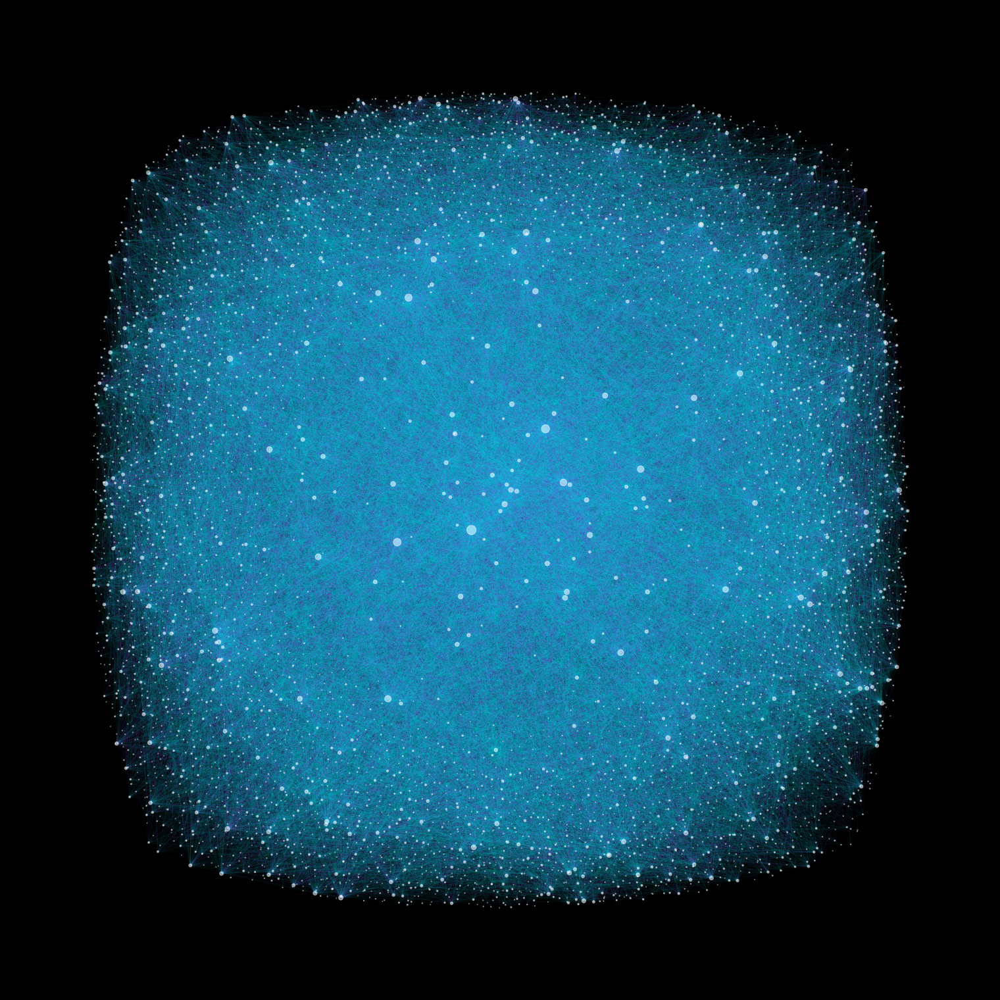

In [290]:
fig=plt.figure(figsize=(15,15))

nx.draw(
    G, 
    pos=pos, 
    width=0.05,
    node_size=node_sizes, 
    alpha=0.5, 
    node_color='white',
    edge_color=edge_colors,
    with_labels=False,
    arrowsize=0,)

plt.axis('off')
fig.set_facecolor("black")
plt.show()

In [295]:
fig=plt.figure(figsize=(20,17))

nx.draw(
    G, 
    pos=pos, 
    width=0.05,
    node_size=node_sizes, 
    alpha=0.5, 
    node_color='white',
    edge_color=edge_colors,
    with_labels=False,
    arrowsize=0,)

plt.axis('off')
# transparent background
fig.patch.set_facecolor('none')
plt.savefig('/home/pelle/Master_Thesis/reports/figures/graphs/frontpage_4.png', transparent=True, dpi=250)
plt.close()

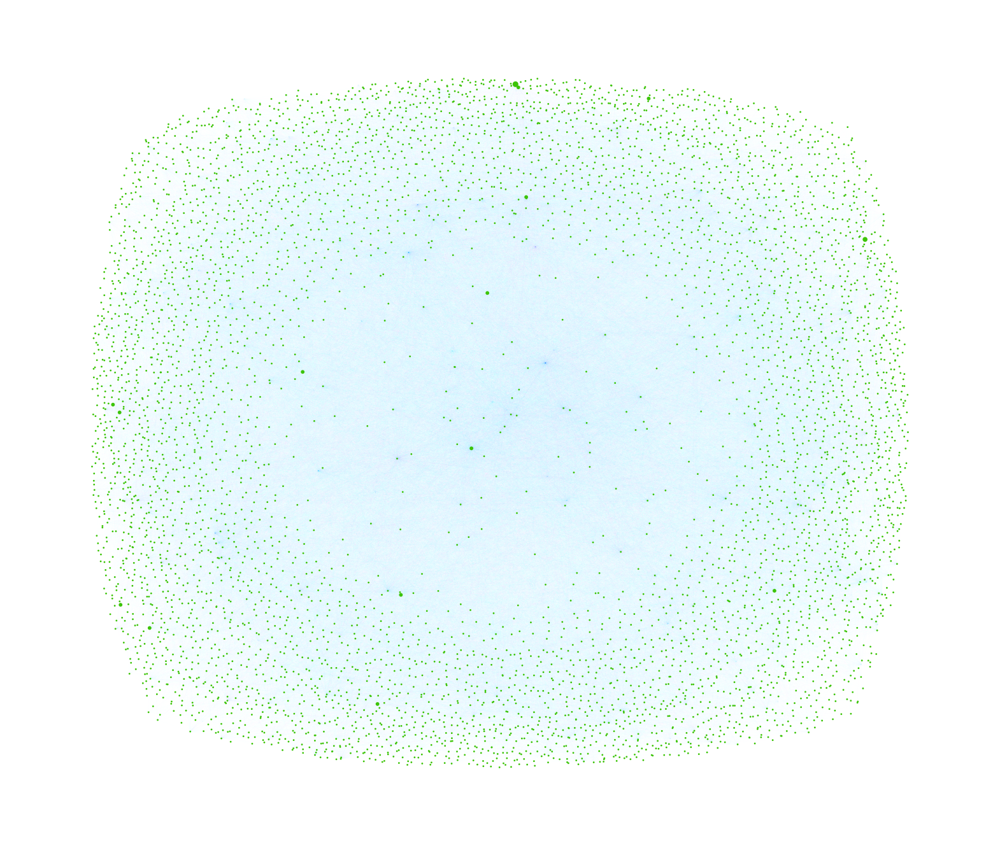

In [294]:
plt.figure(figsize=(20,17))

for node in G.nodes:
    if node not in df_post_balanced_sub['author'].values:
        G.nodes[node]['size']=1
    else: 
        G.nodes[node]['size']=df_post_balanced_sub[df_post_balanced_sub['author']==node]['n_awards'].values[0]*10

nx.draw_networkx_nodes(G, 
                       pos=pos, 
                       node_size=[G.nodes[node]['size'] for node in G.nodes], 
                       alpha=1, 
                       node_color='#3cc406',)



nx.draw_networkx_edges(G, pos=pos, width=0.01, alpha=0.2, edge_color=edge_colors)

plt.axis('off')
plt.show()

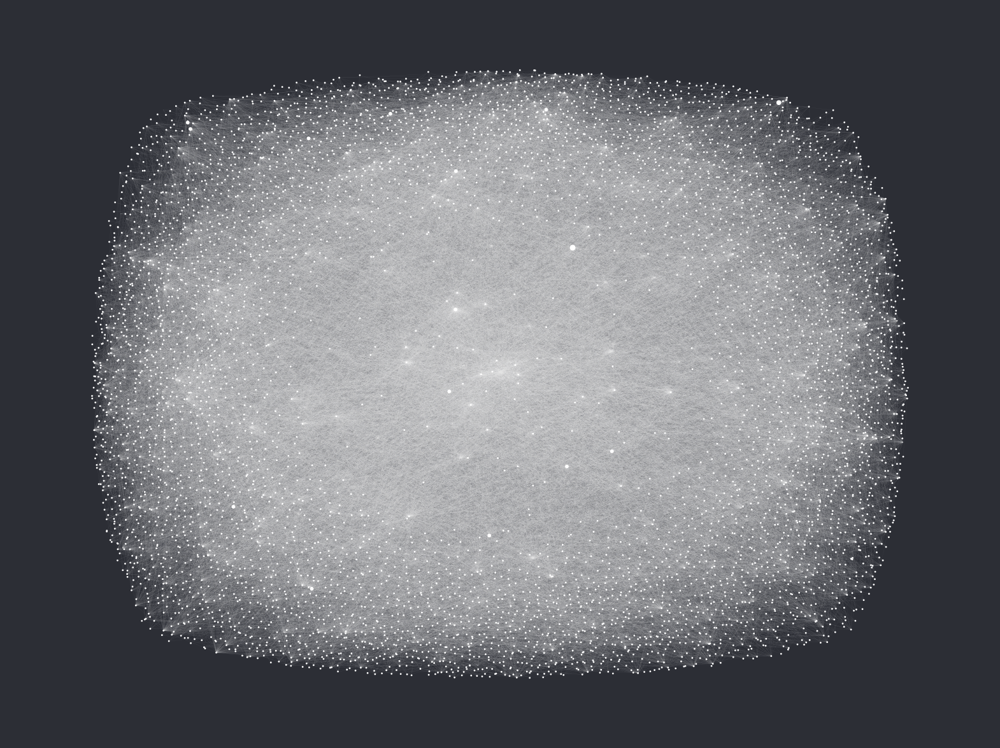

In [76]:
fig=plt.figure(figsize=(20,15))

for node in G.nodes:
    if node not in df_post_balanced_sub['author'].values:
        G.nodes[node]['size']=1
    else: 
        G.nodes[node]['size']=df_post_balanced_sub[df_post_balanced_sub['author']==node]['n_awards'].values[0]*10

nx.draw_networkx_nodes(G, pos=pos, 
                       node_size=[G.nodes[node]['size'] for node in G.nodes], 
                       alpha=1, 
                       node_color='white',)

nx.draw_networkx_edges(G, pos=pos, width=0.1, alpha=0.2, edge_color='white',node_size=0,)

plt.axis('off')
fig.set_facecolor('#2c2e35')
plt.show()

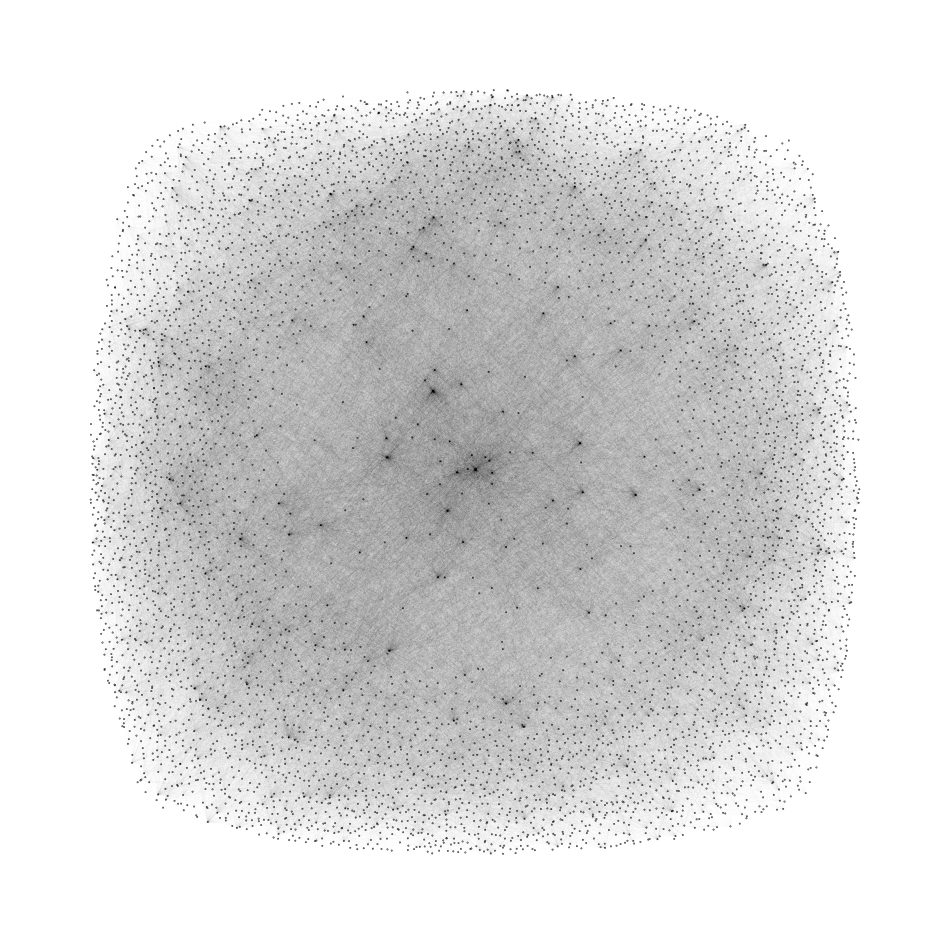

In [63]:
fig=plt.figure(figsize=(12,12))


for node in G.nodes:
    if node not in df_post_balanced_sub['author'].values:
        G.nodes[node]['size']=0.1
        G.nodes[node]['color']='black'
    else: 
        # G.nodes[node]['size']=df_post_balanced_sub[df_post_balanced_sub['author']==node]['n_awards'].values[0]*90
        # G.nodes[node]['color']='#3cc406'
        G.nodes[node]['size']=0.1
        G.nodes[node]['color']='black'

nx.draw_networkx_nodes(G, pos=pos, 
                       node_size=[G.nodes[node]['size'] for node in G.nodes], 
                       alpha=1, 
                       node_color=[G.nodes[node]['color'] for node in G.nodes],)

nx.draw_networkx_edges(G, pos=pos, width=0.01, alpha=0.3, edge_color='black')

plt.axis('off')
fig.set_facecolor("white")
plt.show()